## Dataset Decription:

This dataset contain real estate data 

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import joblib


In [3]:
df = pd.read_csv("House Price India.csv")

In [4]:
df

,id,Date,number of bedrooms,number of bathrooms,living area,lot area,number of floors,waterfront present,number of views,condition of the house,...,Built Year,Renovation Year,Postal Code,Lattitude,Longitude,living_area_renov,lot_area_renov,Number of schools nearby,Distance from the airport,Price
0,6762810145,42491,5,2.50,3650,9050,2.0,0,4,5,...,1921,0,122003,52.8645,-114.557,2880,5400,2,58,2380000
1,6762810635,42491,4,2.50,2920,4000,1.5,0,0,5,...,1909,0,122004,52.8878,-114.470,2470,4000,2,51,1400000
2,6762810998,42491,5,2.75,2910,9480,1.5,0,0,3,...,1939,0,122004,52.8852,-114.468,2940,6600,1,53,1200000
3,6762812605,42491,4,2.50,3310,42998,2.0,0,0,3,...,2001,0,122005,52.9532,-114.321,3350,42847,3,76,838000
4,6762812919,42491,3,2.00,2710,4500,1.5,0,0,4,...,1929,0,122006,52.9047,-114.485,2060,4500,1,51,805000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14615,6762830250,42734,2,1.50,1556,20000,1.0,0,0,4,...,1957,0,122066,52.6191,-114.472,2250,17286,3,76,221700
14616,6762830339,42734,3,2.00,1680,7000,1.5,0,0,4,...,1968,0,122072,52.5075,-114.393,1540,7480,3,59,219200
14617,6762830618,42734,2,1.00,1070,6120,1.0,0,0,3,...,1962,0,122056,52.7289,-114.507,1130,6120,2,64,209000
14618,6762830709,42734,4,1.00,1030,6621,1.0,0,0,4,...,1955,0,122042,52.7157,-114.411,1420,6631,3,54,205000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14620 entries, 0 to 14619
Data columns (total 23 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   id                                     14620 non-null  int64  
 1   Date                                   14620 non-null  int64  
 2   number of bedrooms                     14620 non-null  int64  
 3   number of bathrooms                    14620 non-null  float64
 4   living area                            14620 non-null  int64  
 5   lot area                               14620 non-null  int64  
 6   number of floors                       14620 non-null  float64
 7   waterfront present                     14620 non-null  int64  
 8   number of views                        14620 non-null  int64  
 9   condition of the house                 14620 non-null  int64  
 10  grade of the house                     14620 non-null  int64  
 11  Ar

In [6]:
df_copy = df.copy()
df_copy.drop(columns=['id', 'Date', 'Postal Code'], inplace=True)

In [7]:
df_copy

,number of bedrooms,number of bathrooms,living area,lot area,number of floors,waterfront present,number of views,condition of the house,grade of the house,Area of the house(excluding basement),Area of the basement,Built Year,Renovation Year,Lattitude,Longitude,living_area_renov,lot_area_renov,Number of schools nearby,Distance from the airport,Price
0,5,2.50,3650,9050,2.0,0,4,5,10,3370,280,1921,0,52.8645,-114.557,2880,5400,2,58,2380000
1,4,2.50,2920,4000,1.5,0,0,5,8,1910,1010,1909,0,52.8878,-114.470,2470,4000,2,51,1400000
2,5,2.75,2910,9480,1.5,0,0,3,8,2910,0,1939,0,52.8852,-114.468,2940,6600,1,53,1200000
3,4,2.50,3310,42998,2.0,0,0,3,9,3310,0,2001,0,52.9532,-114.321,3350,42847,3,76,838000
4,3,2.00,2710,4500,1.5,0,0,4,8,1880,830,1929,0,52.9047,-114.485,2060,4500,1,51,805000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14615,2,1.50,1556,20000,1.0,0,0,4,7,1556,0,1957,0,52.6191,-114.472,2250,17286,3,76,221700
14616,3,2.00,1680,7000,1.5,0,0,4,7,1680,0,1968,0,52.5075,-114.393,1540,7480,3,59,219200
14617,2,1.00,1070,6120,1.0,0,0,3,6,1070,0,1962,0,52.7289,-114.507,1130,6120,2,64,209000
14618,4,1.00,1030,6621,1.0,0,0,4,6,1030,0,1955,0,52.7157,-114.411,1420,6631,3,54,205000


In [8]:
df_copy.rename(
    {'number of bedrooms': 'bedrooms',
    'number of bathrooms':'bathrooms',
    'living area': 'living_area',
    'lot area': 'lot_area',
    'number of floors':'no_of_floors',
    'waterfront present':'waterfront_present',
    'number of views':'no_of_views',
    'condition of the house':'conditiion',
    'grade of the house': 'grade',
    'Area of the house(excluding basement)':'area_of_house',
    'Area of the basement':'area_of_basement',
    'Built Year':'blt_year',
    'Renovation Year':'rnv_year',
    'Lattitude':'lat',
    'Longitude':'long',
    'Number of schools nearby':'no_of_school',
    'Distance from the airport':'dist_from_airport',
    'Price':'price'
    }, axis=1, inplace=True
)

In [9]:
# df_copy.rename({'number of bedrooms': 'bedrooms'}, errors='raise')
df_copy

,bedrooms,bathrooms,living_area,lot_area,no_of_floors,waterfront_present,no_of_views,conditiion,grade,area_of_house,area_of_basement,blt_year,rnv_year,lat,long,living_area_renov,lot_area_renov,no_of_school,dist_from_airport,price
0,5,2.50,3650,9050,2.0,0,4,5,10,3370,280,1921,0,52.8645,-114.557,2880,5400,2,58,2380000
1,4,2.50,2920,4000,1.5,0,0,5,8,1910,1010,1909,0,52.8878,-114.470,2470,4000,2,51,1400000
2,5,2.75,2910,9480,1.5,0,0,3,8,2910,0,1939,0,52.8852,-114.468,2940,6600,1,53,1200000
3,4,2.50,3310,42998,2.0,0,0,3,9,3310,0,2001,0,52.9532,-114.321,3350,42847,3,76,838000
4,3,2.00,2710,4500,1.5,0,0,4,8,1880,830,1929,0,52.9047,-114.485,2060,4500,1,51,805000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14615,2,1.50,1556,20000,1.0,0,0,4,7,1556,0,1957,0,52.6191,-114.472,2250,17286,3,76,221700
14616,3,2.00,1680,7000,1.5,0,0,4,7,1680,0,1968,0,52.5075,-114.393,1540,7480,3,59,219200
14617,2,1.00,1070,6120,1.0,0,0,3,6,1070,0,1962,0,52.7289,-114.507,1130,6120,2,64,209000
14618,4,1.00,1030,6621,1.0,0,0,4,6,1030,0,1955,0,52.7157,-114.411,1420,6631,3,54,205000


In [12]:
df_copy.describe()

,bedrooms,bathrooms,living_area,lot_area,no_of_floors,waterfront_present,no_of_views,conditiion,grade,area_of_house,area_of_basement,blt_year,rnv_year,lat,long,living_area_renov,lot_area_renov,no_of_school,dist_from_airport,price
count,14620.000000,14620.000000,14620.000000,1.462000e+04,14620.000000,14620.000000,14620.000000,14620.000000,14620.000000,14620.000000,14620.000000,14620.000000,14620.000000,14620.000000,14620.000000,14620.000000,14620.000000,14620.000000,14620.000000,1.462000e+04
mean,3.379343,2.129583,2098.262996,1.509328e+04,1.502360,0.007661,0.233105,3.430506,7.682421,1801.783926,296.479070,1970.926402,90.924008,52.792848,-114.404007,1996.702257,12753.500068,2.012244,64.950958,5.389322e+05
std,0.938719,0.769934,928.275721,3.791962e+04,0.540239,0.087193,0.766259,0.664151,1.175033,833.809963,448.551409,29.493625,416.216661,0.137522,0.141326,691.093366,26058.414467,0.817284,8.936008,3.675324e+05
min,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,4.000000,370.000000,0.000000,1900.000000,0.000000,52.385900,-114.709000,460.000000,651.000000,1.000000,50.000000,7.800000e+04
25%,3.000000,1.750000,1440.000000,5.010750e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1200.000000,0.000000,1951.000000,0.000000,52.707600,-114.519000,1490.000000,5097.750000,1.000000,57.000000,3.200000e+05
50%,3.000000,2.250000,1930.000000,7.620000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1580.000000,0.000000,1975.000000,0.000000,52.806400,-114.421000,1850.000000,7620.000000,2.000000,65.000000,4.500000e+05
75%,4.000000,2.500000,2570.000000,1.080000e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2240.000000,580.000000,1997.000000,0.000000,52.908900,-114.315000,2380.000000,10125.000000,3.000000,73.000000,6.450000e+05
max,33.000000,8.000000,13540.000000,1.074218e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,53.007600,-113.505000,6110.000000,560617.000000,3.000000,80.000000,7.700000e+06


In [13]:
color_pallete = ['#D81159', '#8F2D56', '#218380', '#FBB13C']
def creat_plot(variable):
    
    sns.set_theme(style='whitegrid')

    fig, axes = plt.subplots(1, 3, figsize=(14, 5))
    
    # Box Plot
    sns.boxplot(data= df_copy, y=variable, color=color_pallete[0], ax=axes[0])
    axes[0].set_title(f'Boxplot of {variable}')

    # Histogram
    sns.histplot(data=df_copy, x=variable, bins=30, kde=True, color= color_pallete[2], ax=axes[1])
    axes[1].set_title(f'Histogram of {variable}')

    #scatter plot
    sns.scatterplot(data=df_copy, x= df_copy.index, y=variable, color=color_pallete[3], ax=axes[2])
    axes[2].set_title(f'Scatterplot of {variable}')
    
    plt.tight_layout()
    plt.show()

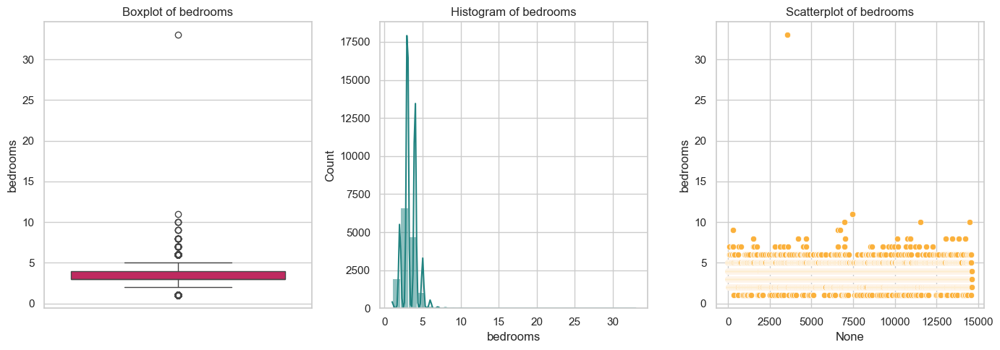

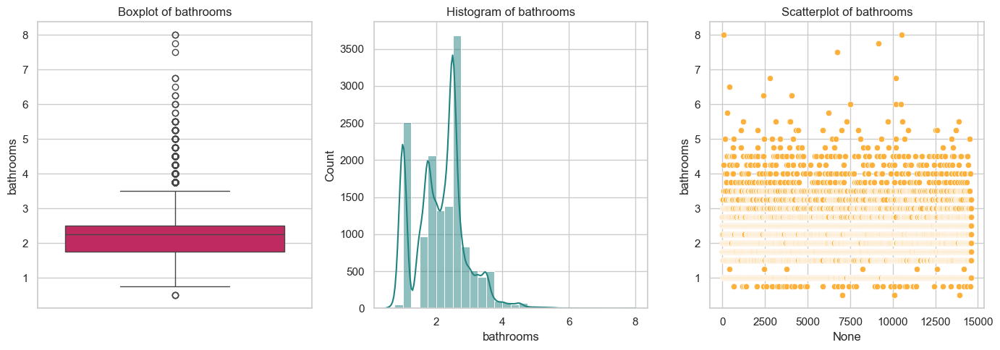

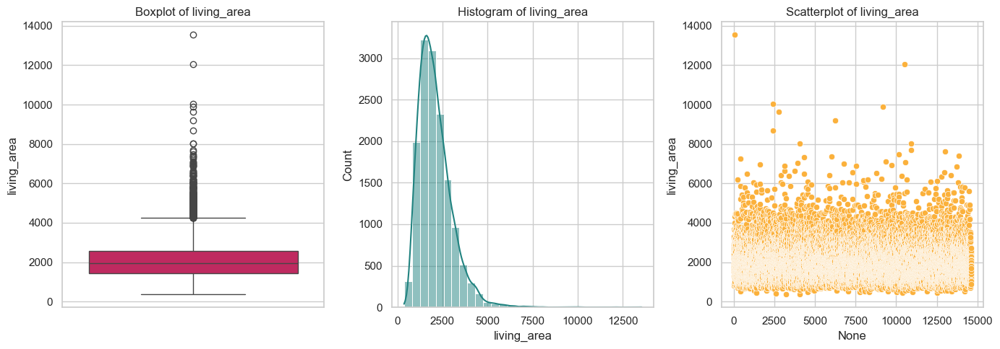

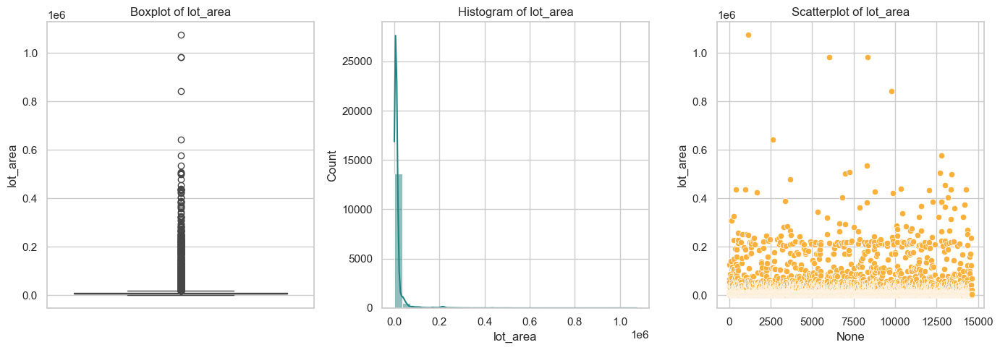

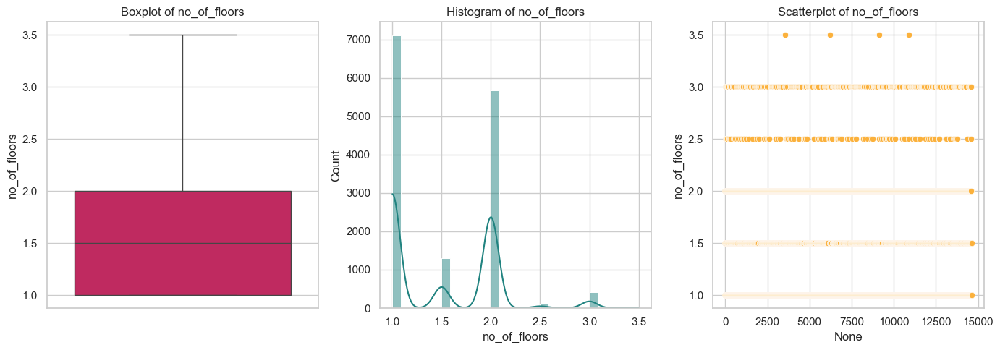

...

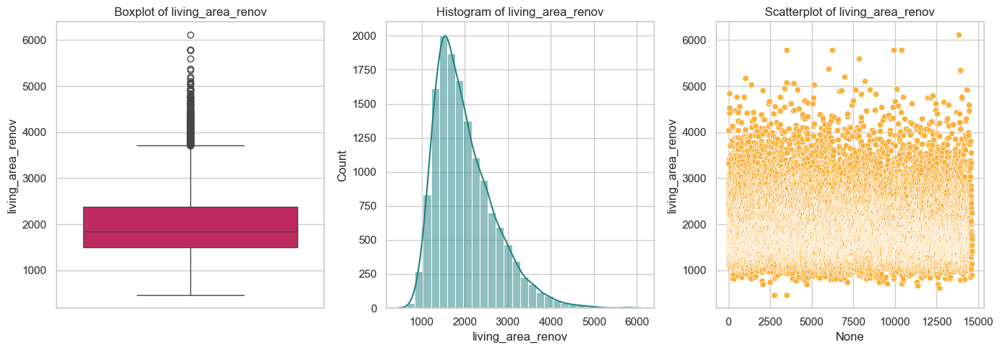

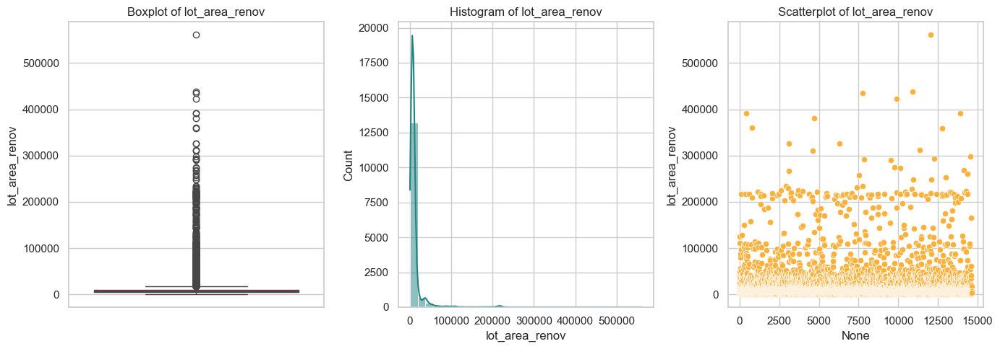

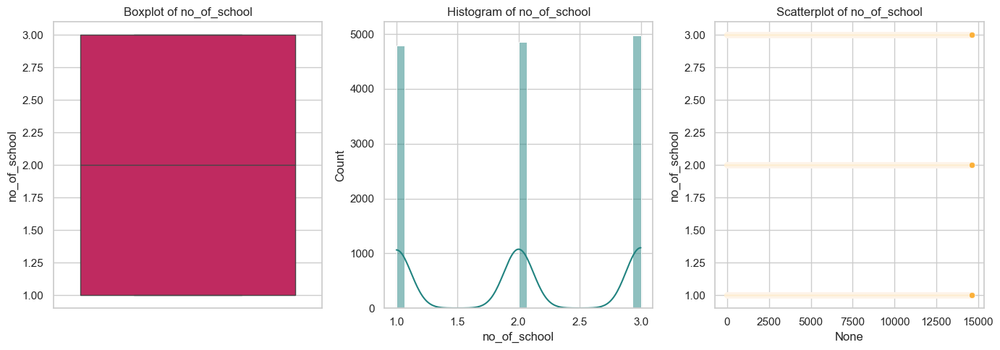

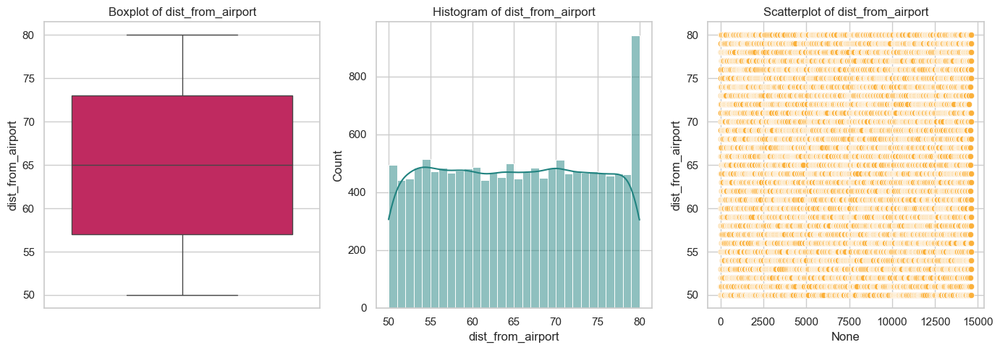

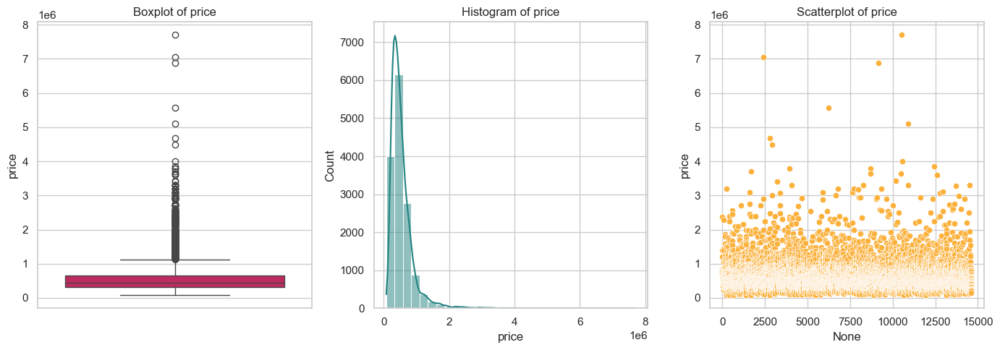

In [14]:
for var in df_copy.columns:
    creat_plot(var)

In [15]:
import plotly.express as plx
fig = plx.scatter_map(data_frame=df_copy, lat= 'lat', lon='long', color='price', map_style='carto-voyager-nolabels', 
                     title='Map of the data', opacity=0.8)

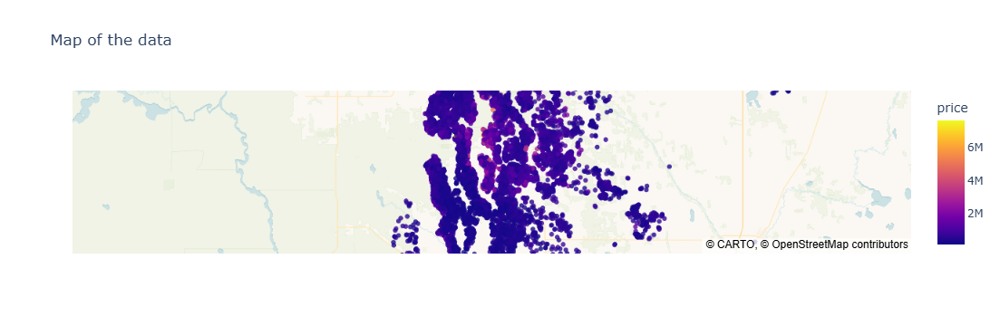

In [16]:
fig.show()

In [150]:

R = 6371  # Earth radius in km

# df = pd.DataFrame({'latitude': [37.7749, 40.7128], 'longitude': [-122.4194, -74.0060]})  # Example DataFrame

df_copy = df_copy.assign(
    x=lambda d: R * np.cos(np.radians(d["lat"])) * np.cos(np.radians(d["long"])),
    y=lambda d: R * np.cos(np.radians(d["lat"])) * np.sin(np.radians(d["long"])),
    z=lambda d: R * np.sin(np.radians(d["lat"]))
)
df_copy = df_copy.assign(
    norm=lambda d: np.sqrt(d["x"]**2 + d["y"]**2 + d["z"]**2),
    x=lambda d: d["x"] / d["norm"],
    y=lambda d: d["y"] / d["norm"],
    z=lambda d: d["z"] / d["norm"]
).drop(columns=["norm"])  # Drop norm column after normalization

# print(df)

print(df_copy)


       bedrooms  bathrooms  living_area  lot_area  no_of_floors  \
0             5       2.50         3650      9050           2.0   
1             4       2.50         2920      4000           1.5   
2             5       2.75         2910      9480           1.5   
3             4       2.50         3310     42998           2.0   
4             3       2.00         2710      4500           1.5   
...         ...        ...          ...       ...           ...   
14615         2       1.50         1556     20000           1.0   
14616         3       2.00         1680      7000           1.5   
14617         2       1.00         1070      6120           1.0   
14618         4       1.00         1030      6621           1.0   
14619         3       1.00          900      4770           1.0   

       waterfront_present  no_of_views  conditiion  grade  area_of_house  ...  \
0                       0            4           5     10           3370  ...   
1                       0        

<Axes: >

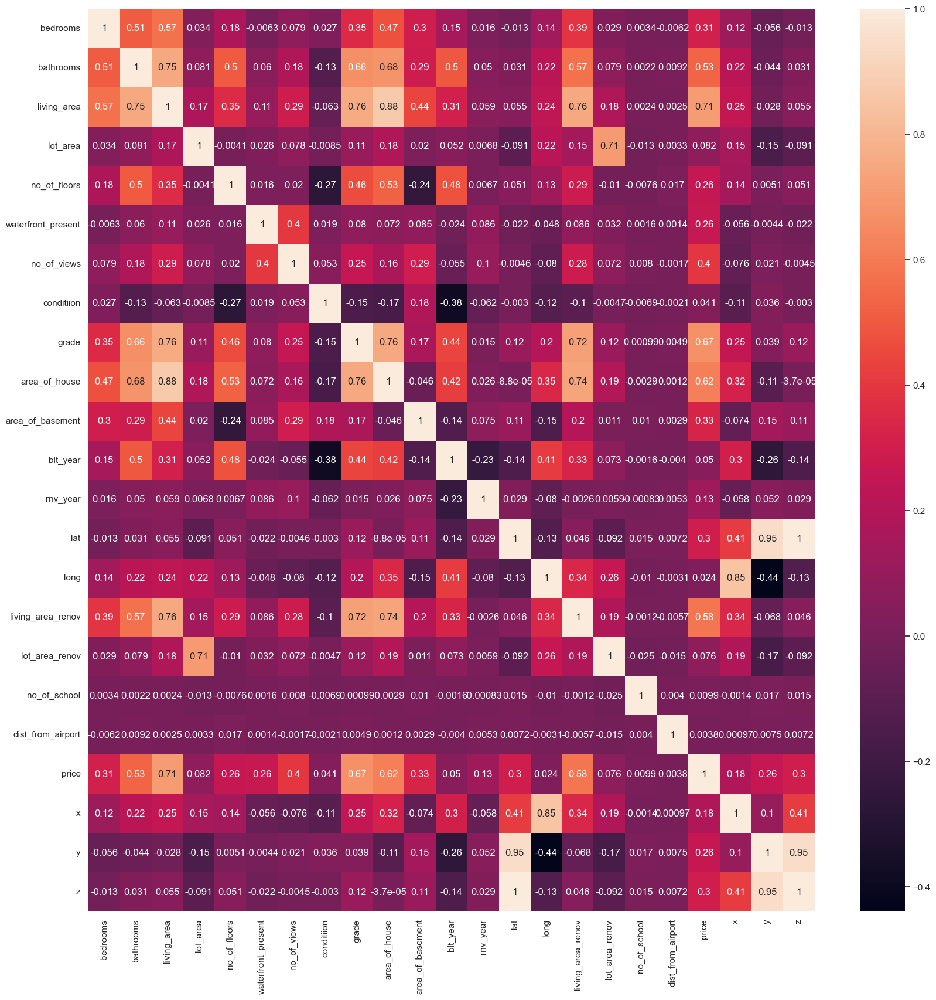

In [152]:
plt.figure(figsize=(20, 20))
sns.heatmap(df_copy.corr(), annot=True)

In [276]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler

In [288]:
df_copy['bathrooms']= df_copy['bathrooms'].astype('int')
df_copy['no_of_floors'] = df_copy['no_of_floors'].astype('int')


In [302]:
df.sample(5)

,id,Date,number of bedrooms,number of bathrooms,living area,lot area,number of floors,waterfront present,number of views,condition of the house,...,Built Year,Renovation Year,Postal Code,Lattitude,Longitude,living_area_renov,lot_area_renov,Number of schools nearby,Distance from the airport,Price
10015,6762829403,42644,3,2.00,1530,8749,1.0,0,0,3,...,1995,0,122018,52.5274,-114.562,1750,8749,3,72,247500
12423,6762828846,42686,2,1.50,980,1296,2.0,0,0,3,...,2001,0,122038,52.9375,-114.526,1100,1228,1,78,260000
13624,6762830173,42711,3,1.75,1430,8505,1.0,0,0,4,...,1968,0,122040,52.5473,-114.509,1190,8640,3,60,225000
9892,6762815163,42643,4,2.50,3340,34238,1.0,0,0,4,...,1977,0,122037,52.9954,-114.266,2400,36590,2,70,655000
7465,6762820455,42602,2,2.50,1830,8107,1.0,0,0,5,...,1946,0,122022,52.9310,-114.495,1260,6960,3,61,460000


In [300]:
df['number of views'].value_counts()

number of views
0    13198
2      636
3      351
1      219
4      216
Name: count, dtype: int64

In [280]:
transformer = ColumnTransformer(
    [('scaler', MinMaxScaler(), ['bedrooms', 'bathrooms', 'living_area', 'lot_area', 'no_of_floors',
       'waterfront_present', 'no_of_views', 'conditiion', 'grade',
       'area_of_house', 'area_of_basement', 'blt_year', 'rnv_year',
       'living_area_renov', 'lot_area_renov', 'no_of_school',
       'dist_from_airport'])], remainder='passthrough'
)

In [282]:
data = transformer.fit_transform(df_copy)

In [284]:
transformed_df = pd.DataFrame(data, columns=X.columns)

In [286]:
transformed_df

,bedrooms,bathrooms,living_area,lot_area,no_of_floors,waterfront_present,no_of_views,conditiion,grade,area_of_house,area_of_basement,blt_year,rnv_year,living_area_renov,lot_area_renov,no_of_school,dist_from_airport,x,y,z
0,0.12500,0.250,0.249051,0.007945,0.5,0.0,1.0,1.00,0.666667,0.331858,0.058091,0.182609,0.000000,0.428319,0.008481,0.5,0.266667,-0.250898,-0.549096,0.797210
1,0.09375,0.250,0.193622,0.003241,0.0,0.0,0.0,1.00,0.444444,0.170354,0.209544,0.078261,0.000000,0.355752,0.005981,0.5,0.033333,-0.249929,-0.549181,0.797455
2,0.12500,0.250,0.192863,0.008345,0.0,0.0,0.0,0.50,0.444444,0.280973,0.000000,0.339130,0.000000,0.438938,0.010624,0.0,0.100000,-0.249925,-0.549223,0.797428
3,0.09375,0.250,0.223235,0.039562,0.5,0.0,0.0,0.50,0.555556,0.325221,0.000000,0.878261,0.000000,0.511504,0.075355,1.0,0.866667,-0.248125,-0.549000,0.798144
4,0.06250,0.250,0.177677,0.003707,0.0,0.0,0.0,0.75,0.444444,0.167035,0.172199,0.252174,0.000000,0.283186,0.006874,0.0,0.033333,-0.249975,-0.548902,0.797633
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14615,0.03125,0.125,0.090053,0.018143,0.0,0.0,0.0,0.75,0.333333,0.131195,0.000000,0.495652,0.000000,0.316814,0.029707,1.0,0.866667,-0.251495,-0.552570,0.794617
14616,0.06250,0.250,0.099468,0.006035,0.0,0.0,0.0,0.75,0.333333,0.144912,0.000000,0.591304,0.000000,0.191150,0.012195,1.0,0.300000,-0.251371,-0.554325,0.793433
14617,0.03125,0.125,0.053151,0.005216,0.0,0.0,0.0,0.50,0.222222,0.077434,0.000000,0.539130,0.000000,0.118584,0.009767,0.5,0.466667,-0.251200,-0.551030,0.795779
14618,0.09375,0.125,0.050114,0.005682,0.0,0.0,0.0,0.75,0.222222,0.073009,0.000000,0.478261,0.000000,0.169912,0.010679,1.0,0.133333,-0.250352,-0.551617,0.795640


In [178]:
color_pallete = ['#D81159', '#8F2D56', '#218380', '#FBB13C']
def create_plot(df_copy, variable):
    
    sns.set_theme(style='whitegrid')

    fig, axes = plt.subplots(1, 3, figsize=(14, 5))
    
    # Box Plot
    sns.boxplot(data= df_copy, y=variable, color=color_pallete[0], ax=axes[0])
    axes[0].set_title(f'Boxplot of {variable}')

    # Histogram
    sns.histplot(data=df_copy, x=variable, bins=30, kde=True, color= color_pallete[2], ax=axes[1])
    axes[1].set_title(f'Histogram of {variable}')

    #scatter plot
    sns.scatterplot(data=df_copy, x= df_copy.index, y=variable, color=color_pallete[3], ax=axes[2])
    axes[2].set_title(f'Scatterplot of {variable}')
    
    plt.tight_layout()
    plt.show()

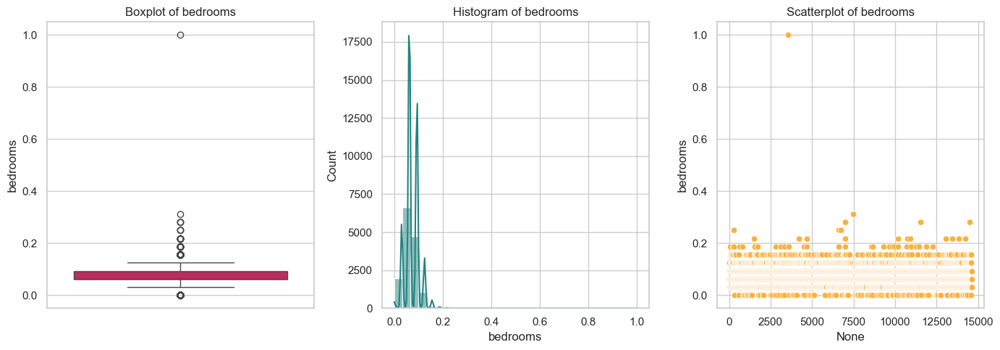

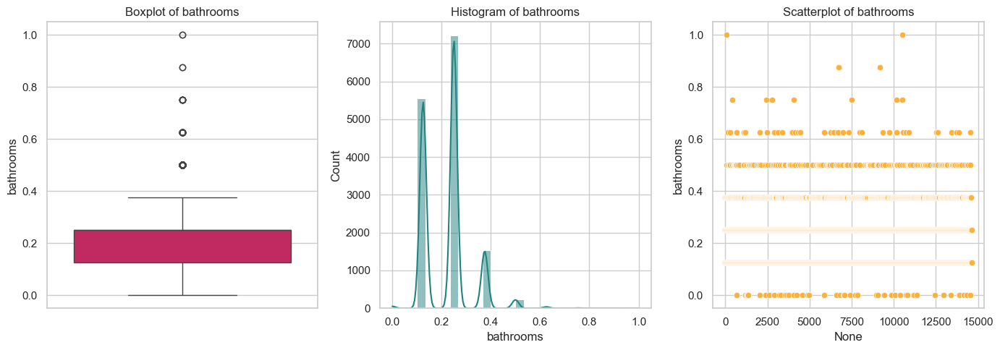

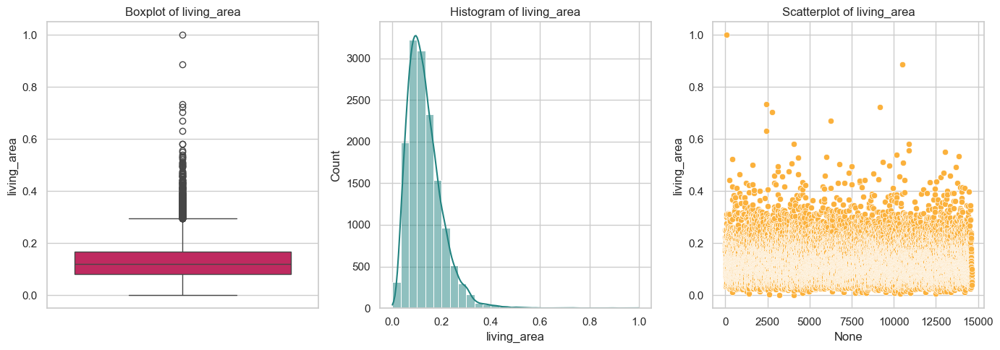

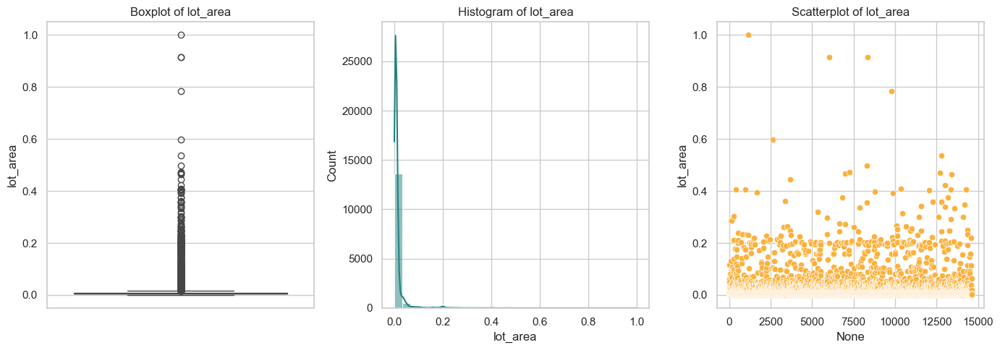

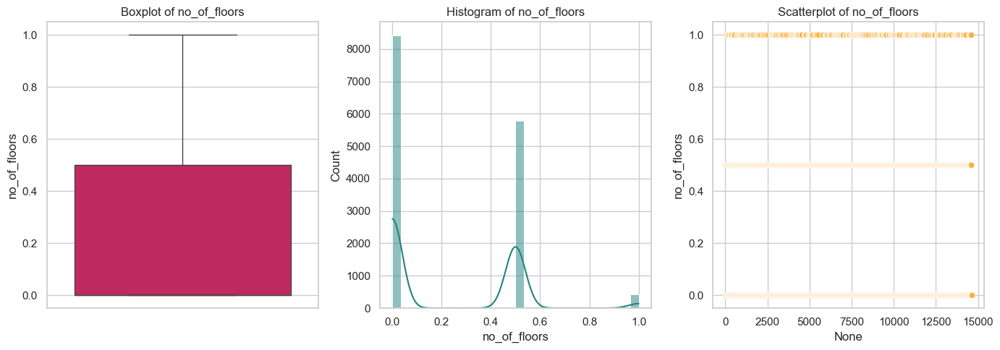

...

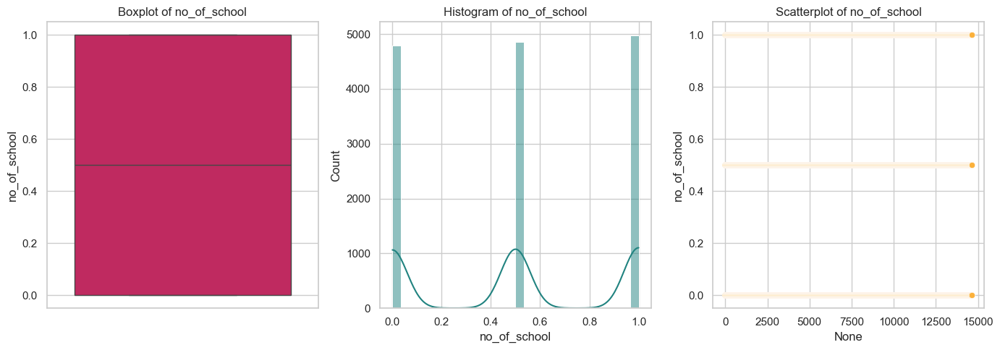

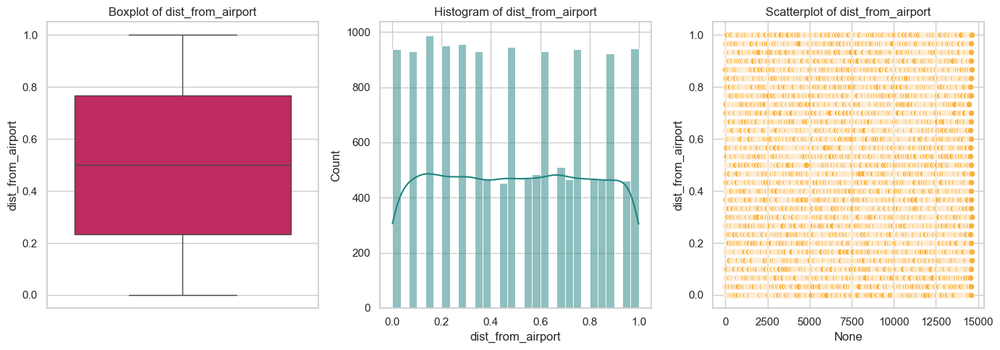

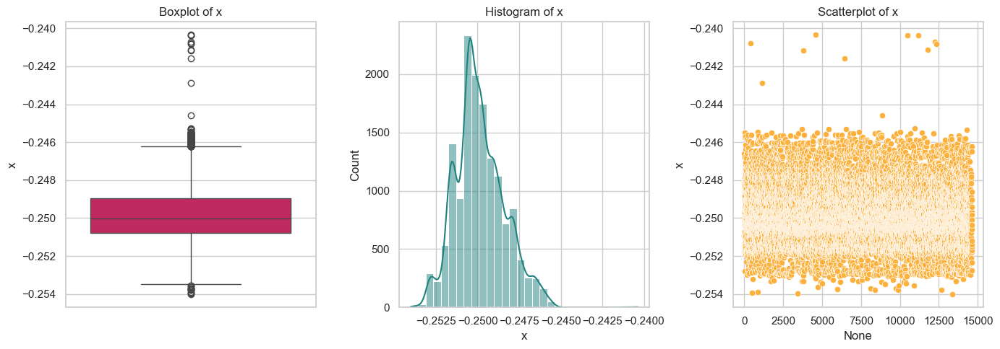

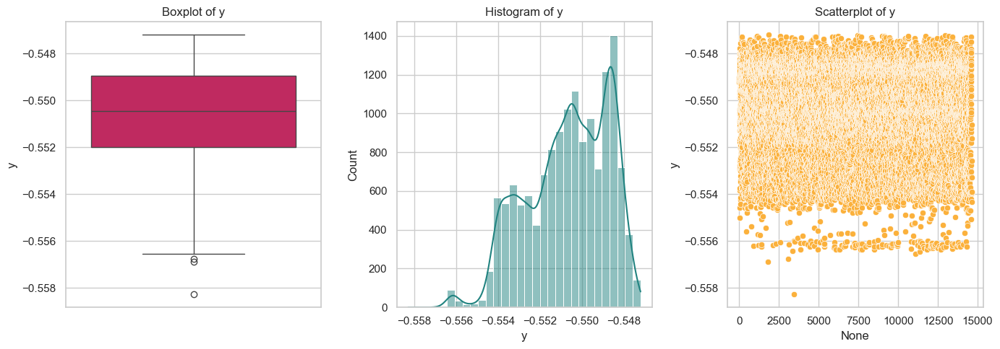

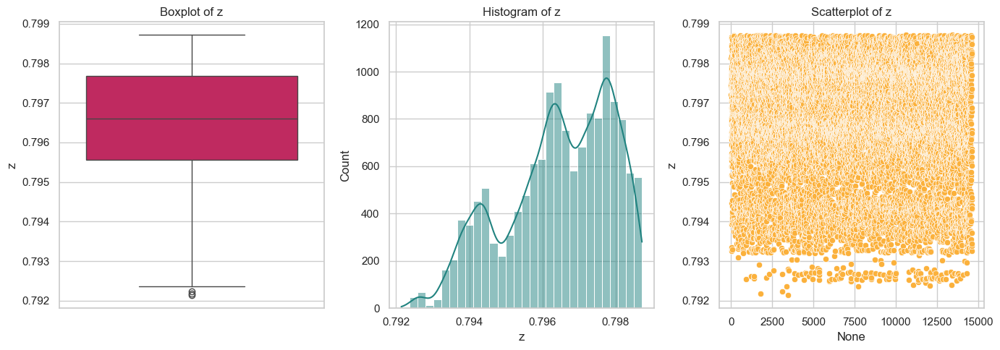

In [180]:
for var in transformed_df.columns:
    create_plot(transformed_df, var)

,bedrooms,bathrooms,living_area,lot_area,no_of_floors,waterfront_present,no_of_views,conditiion,grade,area_of_house,...,lat,long,living_area_renov,lot_area_renov,no_of_school,dist_from_airport,price,x,y,z
0,5,2.50,3650,9050,2.0,0,4,5,10,3370,...,52.8645,-114.557,2880,5400,2,58,2380000,-0.250898,-0.549096,0.797210
1,4,2.50,2920,4000,1.5,0,0,5,8,1910,...,52.8878,-114.470,2470,4000,2,51,1400000,-0.249929,-0.549181,0.797455
2,5,2.75,2910,9480,1.5,0,0,3,8,2910,...,52.8852,-114.468,2940,6600,1,53,1200000,-0.249925,-0.549223,0.797428
3,4,2.50,3310,42998,2.0,0,0,3,9,3310,...,52.9532,-114.321,3350,42847,3,76,838000,-0.248125,-0.549000,0.798144
4,3,2.00,2710,4500,1.5,0,0,4,8,1880,...,52.9047,-114.485,2060,4500,1,51,805000,-0.249975,-0.548902,0.797633
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14615,2,1.50,1556,20000,1.0,0,0,4,7,1556,...,52.6191,-114.472,2250,17286,3,76,221700,-0.251495,-0.552570,0.794617
14616,3,2.00,1680,7000,1.5,0,0,4,7,1680,...,52.5075,-114.393,1540,7480,3,59,219200,-0.251371,-0.554325,0.793433
14617,2,1.00,1070,6120,1.0,0,0,3,6,1070,...,52.7289,-114.507,1130,6120,2,64,209000,-0.251200,-0.551030,0.795779
14618,4,1.00,1030,6621,1.0,0,0,4,6,1030,...,52.7157,-114.411,1420,6631,3,54,205000,-0.250352,-0.551617,0.795640


In [236]:
def scatter_plot(data, var1):
    plt.figure(figsize=(10, 5))
    sns.scatterplot(data=data, x=var1, y='price', markers='*', color= '#7D0A0A')
    # sns.lineplot(data=data, x=var1, y='price')
    plt.title(f'Scatterplot of {var1} vs price')
    plt.xlabel(var1)
    plt.show()
    

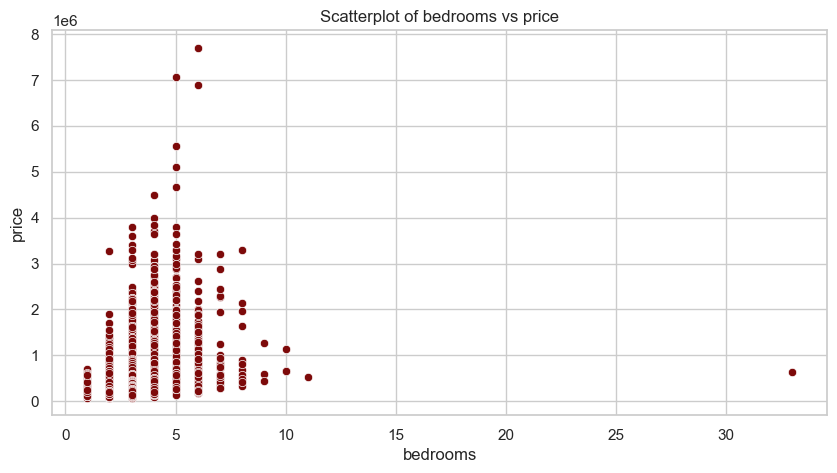

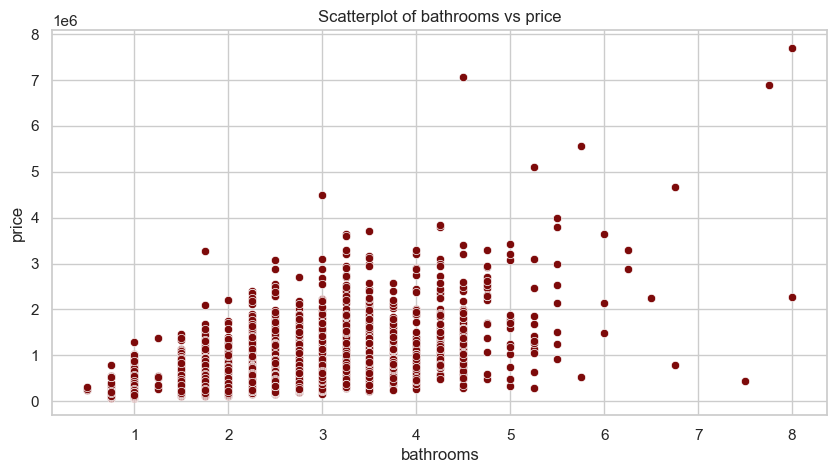

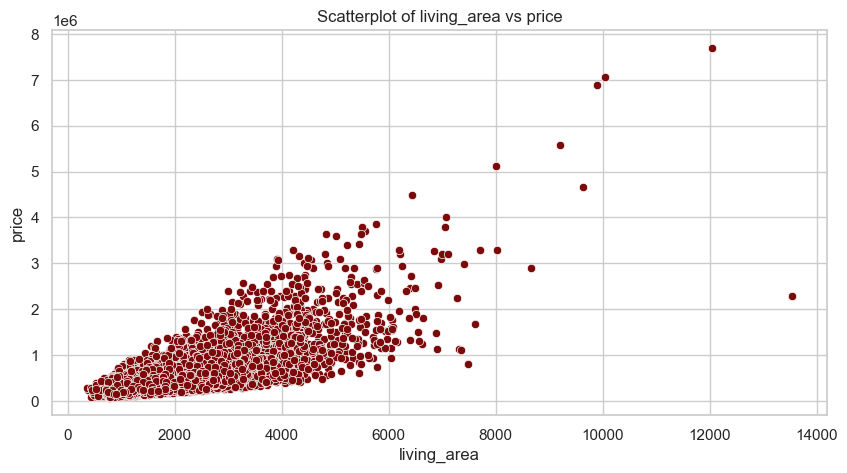

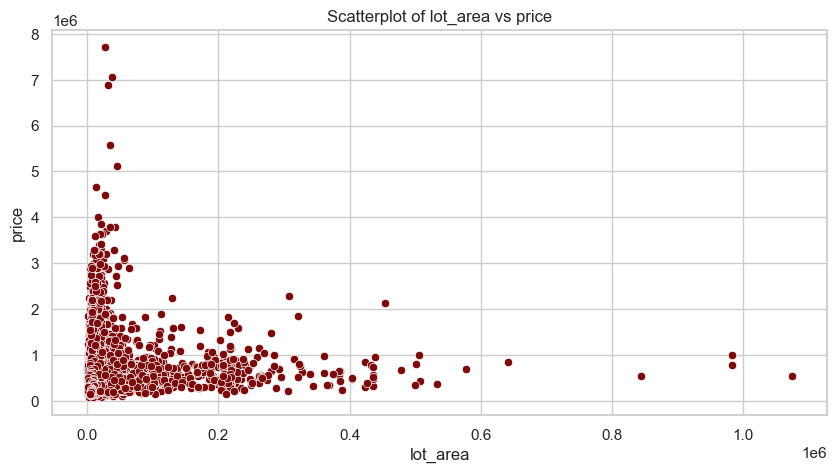

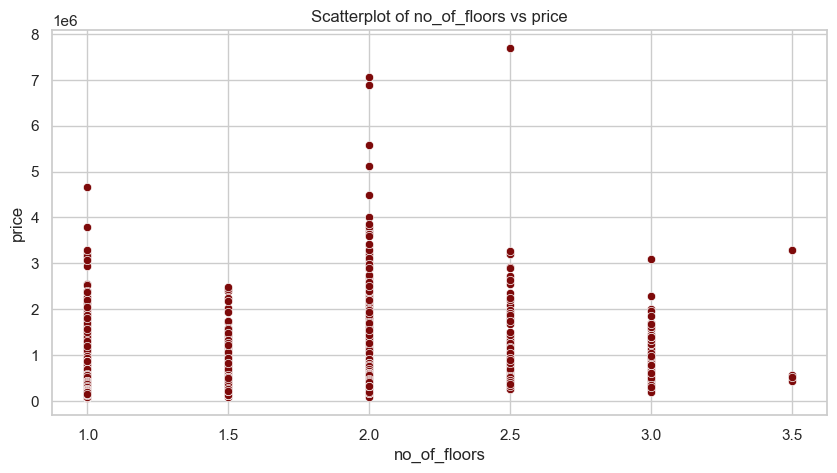

...

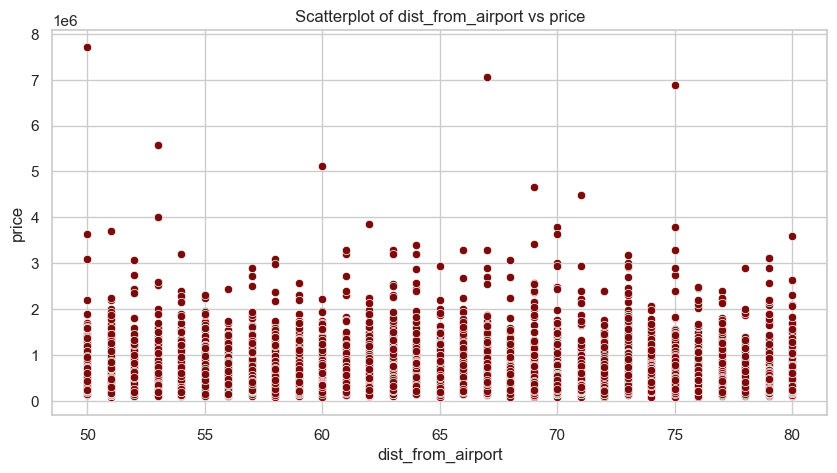

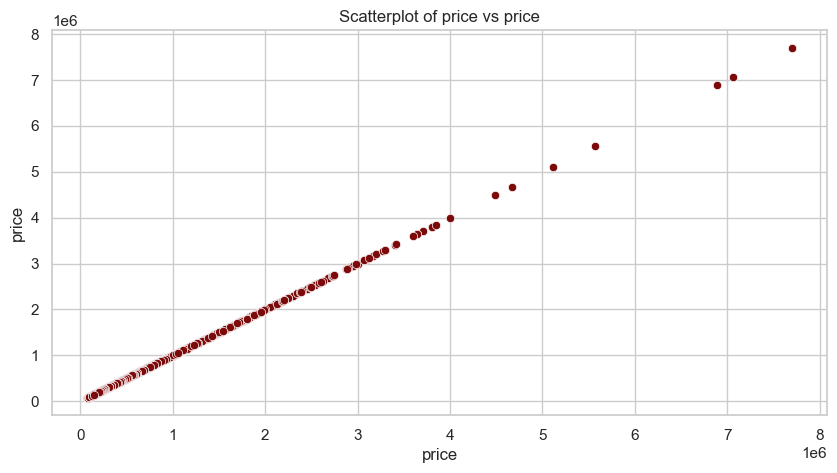

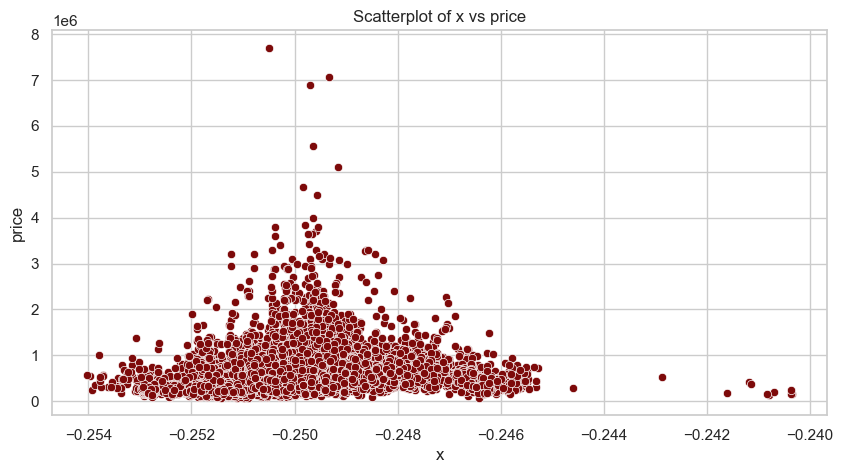

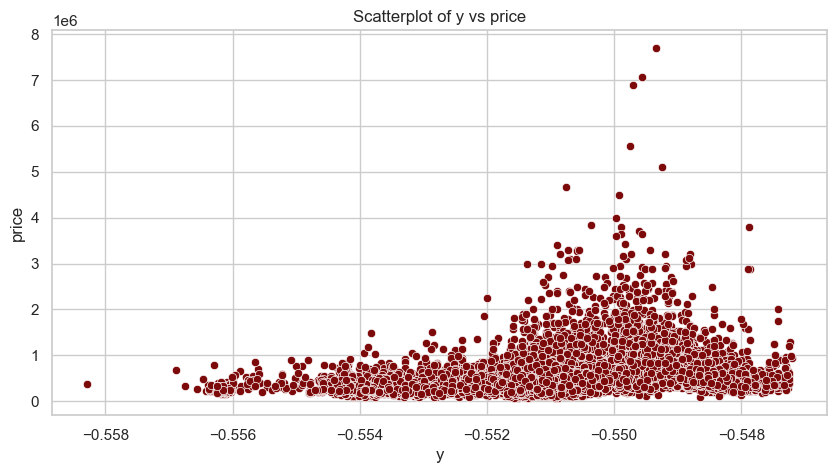

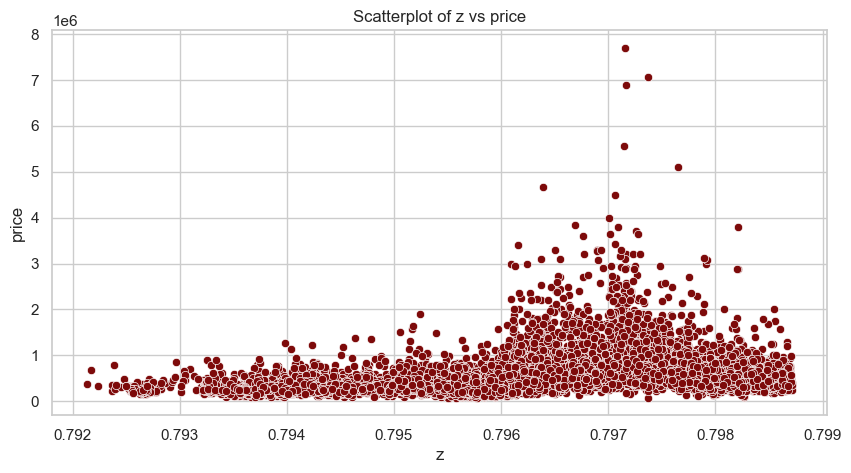

In [240]:
for var in df_copy.columns:
    scatter_plot(df_copy, var)

<Axes: xlabel='bedrooms', ylabel='price'>

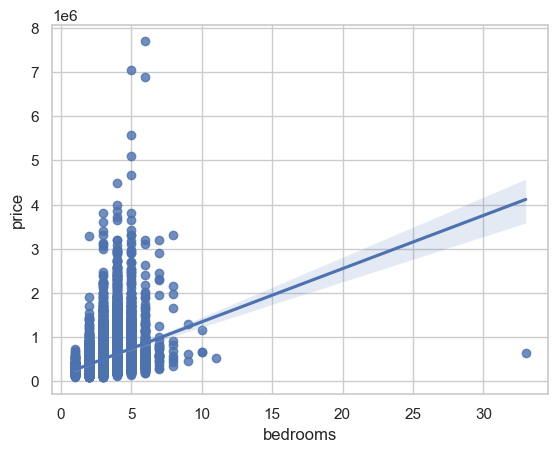

In [228]:
sns.regplot(data= df_copy, x= 'bedrooms', y= 'price')

In [262]:
def transform(data, var):
    data[var] = np.log1p(data[var])


In [264]:
import pandas as pd

def filter_outliers_iqr(df, columns=None, threshold=1.5):
    """
    Removes outliers from a DataFrame based on the IQR method.
    
    Parameters:
        df (pd.DataFrame): Input DataFrame
        columns (list, optional): List of column names to filter. If None, all numeric columns are considered.
        threshold (float, optional): Multiplier for IQR (default is 1.5)
    
    Returns:
        pd.DataFrame: DataFrame with outliers removed
    """
    if columns is None:
        columns = df.select_dtypes(include=['number']).columns  # Select all numeric columns

    filtered_df = df.copy()

    for col in columns:
        Q1 = filtered_df[col].quantile(0.25)
        Q3 = filtered_df[col].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - threshold * IQR
        upper_bound = Q3 + threshold * IQR

        filtered_df = filtered_df[(filtered_df[col] >= lower_bound) & (filtered_df[col] <= upper_bound)]

    return filtered_df


In [268]:
transformed_df_cleaned = filter_outliers_iqr(transformed_df)

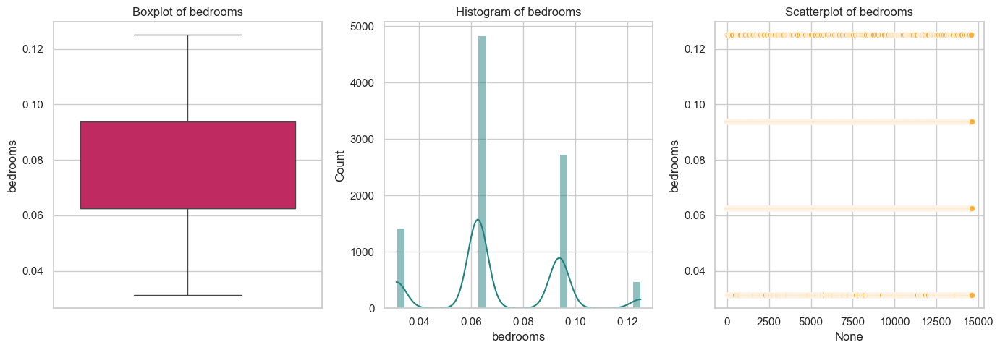

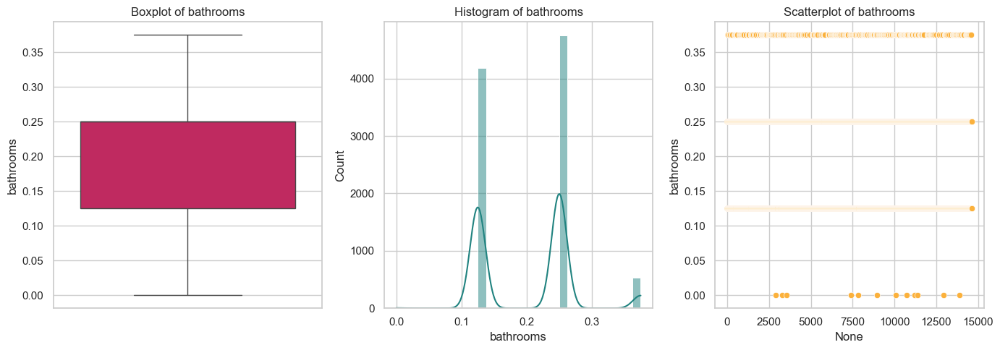

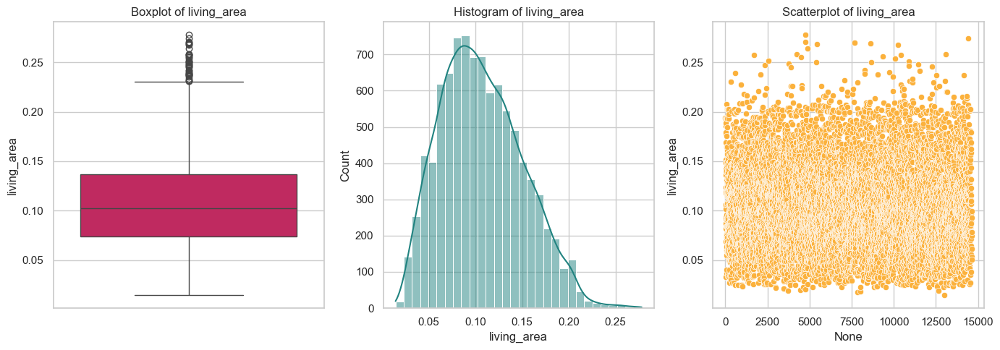

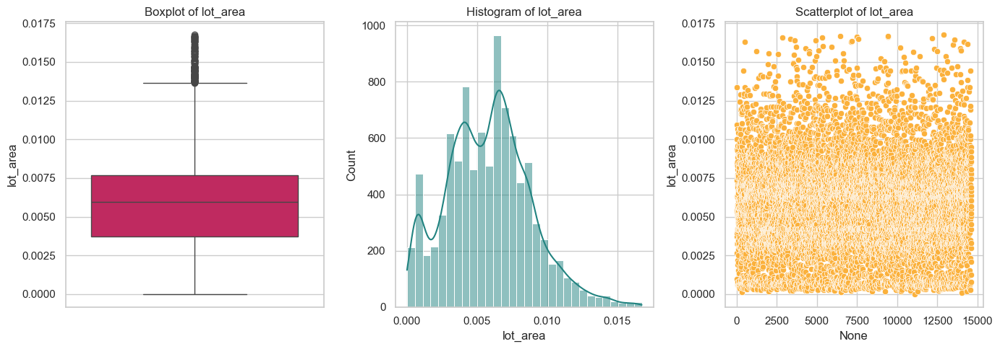

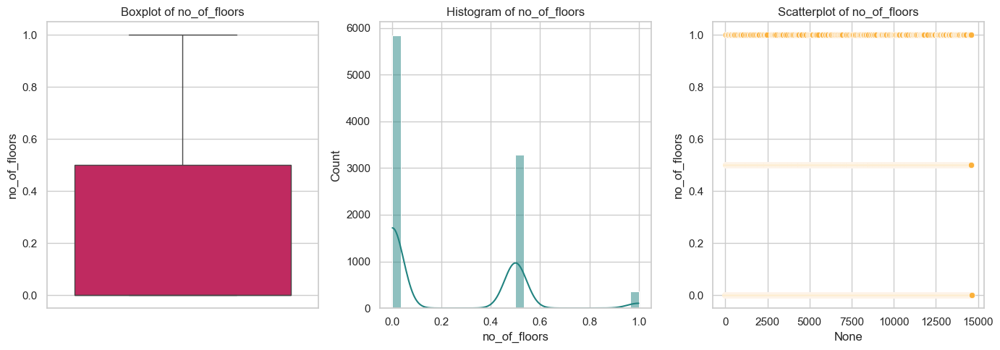

...

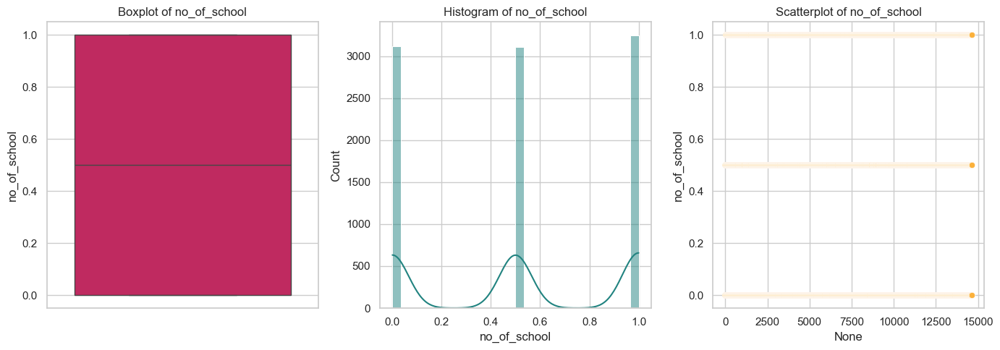

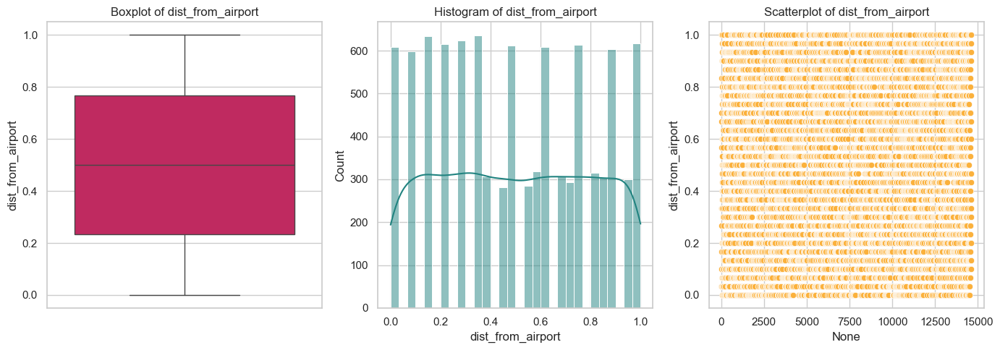

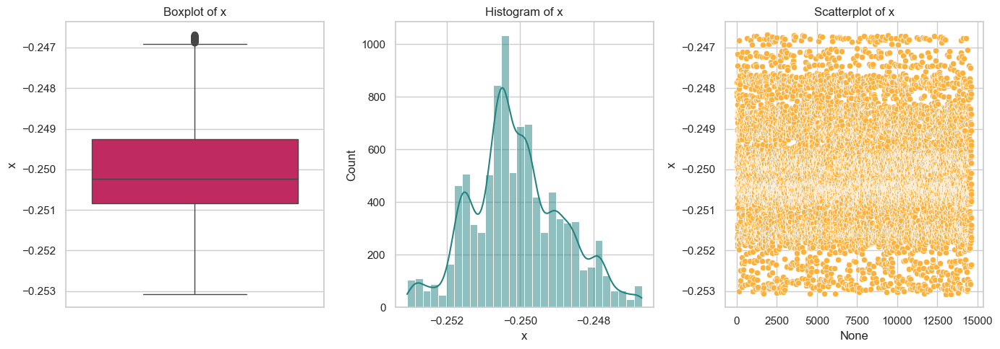

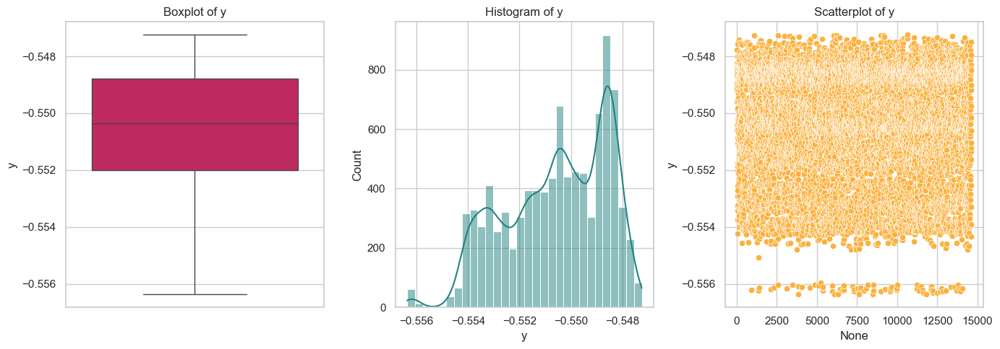

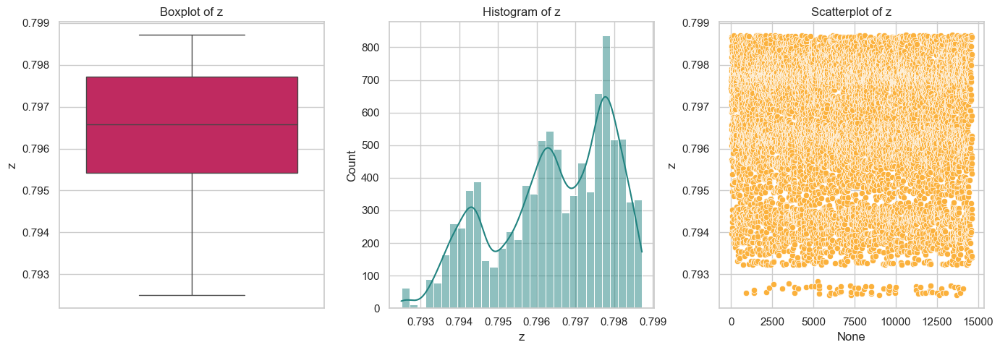

In [270]:
for var in transformed_df_cleaned.columns:
    create_plot(transformed_df_cleaned, var)

In [272]:
transformed_df_cleaned

,bedrooms,bathrooms,living_area,lot_area,no_of_floors,waterfront_present,no_of_views,conditiion,grade,area_of_house,area_of_basement,blt_year,rnv_year,living_area_renov,lot_area_renov,no_of_school,dist_from_airport,x,y,z
1,0.09375,0.250,0.193622,0.003241,0.0,0.0,0.0,1.00,0.444444,0.170354,0.209544,0.078261,0.0,0.355752,0.005981,0.5,0.033333,-0.249929,-0.549181,0.797455
2,0.12500,0.250,0.192863,0.008345,0.0,0.0,0.0,0.50,0.444444,0.280973,0.000000,0.339130,0.0,0.438938,0.010624,0.0,0.100000,-0.249925,-0.549223,0.797428
4,0.06250,0.250,0.177677,0.003707,0.0,0.0,0.0,0.75,0.444444,0.167035,0.172199,0.252174,0.0,0.283186,0.006874,0.0,0.033333,-0.249975,-0.548902,0.797633
5,0.06250,0.250,0.169324,0.003940,0.0,0.0,0.0,0.75,0.555556,0.147124,0.186722,0.443478,0.0,0.339823,0.007320,0.0,0.566667,-0.250931,-0.548334,0.797724
7,0.06250,0.125,0.141989,0.009368,0.5,0.0,0.0,1.00,0.444444,0.130531,0.143154,0.200000,0.0,0.196460,0.017728,1.0,0.700000,-0.249827,-0.548653,0.797851
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14613,0.06250,0.125,0.078208,0.009225,0.0,0.0,0.0,0.75,0.333333,0.113938,0.000000,0.591304,0.0,0.173451,0.017455,0.5,0.300000,-0.252340,-0.553941,0.793394
14614,0.06250,0.125,0.092635,0.006902,0.0,0.0,0.0,0.50,0.333333,0.090708,0.082988,0.686957,0.0,0.215929,0.013001,0.0,1.000000,-0.249405,-0.553917,0.794338
14616,0.06250,0.250,0.099468,0.006035,0.0,0.0,0.0,0.75,0.333333,0.144912,0.000000,0.591304,0.0,0.191150,0.012195,1.0,0.300000,-0.251371,-0.554325,0.793433
14617,0.03125,0.125,0.053151,0.005216,0.0,0.0,0.0,0.50,0.222222,0.077434,0.000000,0.539130,0.0,0.118584,0.009767,0.5,0.466667,-0.251200,-0.551030,0.795779


In [274]:
transformed_df_cleaned.describe()

,bedrooms,bathrooms,living_area,lot_area,no_of_floors,waterfront_present,no_of_views,conditiion,grade,area_of_house,area_of_basement,blt_year,rnv_year,living_area_renov,lot_area_renov,no_of_school,dist_from_airport,x,y,z
count,9477.000000,9477.000000,9477.000000,9477.000000,9477.00000,9477.0,9477.0,9477.000000,9477.000000,9477.000000,9477.000000,9477.000000,9477.0,9477.000000,9477.000000,9477.000000,9477.000000,9477.000000,9477.000000,9477.000000
mean,0.069998,0.201369,0.107003,0.005846,0.21051,0.0,0.0,0.613696,0.374169,0.130446,0.047718,0.613594,0.0,0.230385,0.010787,0.506595,0.498973,-0.250091,-0.550575,0.796438
std,0.023908,0.074107,0.043603,0.003004,0.28190,0.0,0.0,0.167068,0.087666,0.061030,0.071742,0.256871,0.0,0.082961,0.005070,0.409733,0.298322,0.001243,0.001957,0.001491
min,0.031250,0.000000,0.014427,0.000000,0.00000,0.0,0.0,0.250000,0.222222,0.012168,0.000000,0.000000,0.0,0.028319,0.000000,0.000000,0.000000,-0.253080,-0.556371,0.792497
25%,0.062500,0.125000,0.073652,0.003707,0.00000,0.0,0.0,0.500000,0.333333,0.084071,0.000000,0.443478,0.0,0.169912,0.007052,0.000000,0.233333,-0.250835,-0.552007,0.795416
50%,0.062500,0.250000,0.102506,0.005937,0.00000,0.0,0.0,0.500000,0.333333,0.116150,0.000000,0.626087,0.0,0.215929,0.011338,0.500000,0.500000,-0.250237,-0.550350,0.796585
75%,0.093750,0.250000,0.136674,0.007688,0.50000,0.0,0.0,0.750000,0.444444,0.165929,0.095436,0.843478,0.0,0.283186,0.014124,1.000000,0.766667,-0.249264,-0.548796,0.797725
max,0.125000,0.375000,0.277904,0.016746,1.00000,0.0,0.0,1.000000,0.555556,0.306416,0.259336,1.000000,0.0,0.465487,0.025410,1.000000,1.000000,-0.246688,-0.547249,0.798715
